In [1]:
import networkx as nx
from scipy.sparse import linalg as scp_sla
import numpy as np
import matplotlib.pyplot as plt

import sim_lib.util as util
import sim_lib.graph_networkx as gnx
import sim_lib.attr_lib.util as attr_util
from sim_lib.attr_lib.formation import *
import sim_lib.attr_lib.vis as vis

In [2]:
params = {
    'context_count' : 8,
    'k' : 8,
    'attr_func' : attr_util.discrete_pareto_val, # attribute assignment function
    'edge_util_func' : attr_util.max_inv_frequency,
    'edge_proposal' : attr_util.const_one,
    'vtx_util' : attr_util.logistic,
    'edge_selection' : attr_util.seq_projection_edge_edit,
    'attr_copy' : attr_util.freq_attr_copy,
    'seed_type' : 'erdos_renyi', # Type of seed network
    'max_clique_size' : 10,
    'vtx_types' :
        {
            'wide' : { 'likelihood' : 1.0,
                      'struct_util' : attr_util.ball2_size,
                      'color' : 'blue' },
            'tall' : { 'likelihood' : 0.0,
                      'struct_util' : attr_util.potential_density,
                      'color' : 'red' }
        }
}

In [3]:
def graph_density(G_nxc):
    denum = (len(G_nxc.nodes) * (len(G_nxc.nodes) - 1))
    num = sum([ G_nxc.degree[v] for v in G_nxc.nodes])
    return num / denum

def second_eigv(G_nx):
    laplacian = nx.linalg.laplacianmatrix.normalized_laplacian_matrix(G_nx)
    eigvals = scp_sla.eigs(laplacian.toarray(), return_eigenvectors=False)
    eigvals.sort()
    return eigvals[1]

def apl(G_nx):
    return nx.average_shortest_path_length(G_nx)

def diam(G_nx):
    return nx.diameter(G_nx)

def bipartite_check(G_nx):
    return nx.is_bipartite(G_nx)

def modularity(G_nx):
    partitions = nx_comm.greedy_modularity_communities(G_nx)
    return nx_comm.modularity(G_nx, partitions)

def total_struct_util(G):
    return sum([ u.data['struct_util'](u, G) for u in G.vertices ])

def average_neighborhood_overlap(G_nxc):
    nbor_overlaps = []
    vertices = list(G_nxc.nodes)
    for u_idx, u in enumerate(vertices):
        for v in vertices[u_idx + 1:]:
            nbor_overlaps.append(len(list(nx.common_neighbors(G_nxc, u, v))))
    return sum(nbor_overlaps) / len(vertices)

def print_metrics(G):
    G_nx = gnx.graph_to_nx(G)
    G_nx_comp_nodes = list(nx.connected_components(G_nx))
    G_nx_largest = G_nx.subgraph(max(G_nx_comp_nodes, key=len))
    G_nx_comps = [ G_nx.subgraph(G_nxc_nodes) for G_nxc_nodes in G_nx_comp_nodes ]
    
    component_sizes = [ len(G_nxc) for G_nxc in G_nx_comps ]
    gd = [ graph_density(G_nxc) for G_nxc in G_nx_comps ]
    avg_pl = apl(G_nx_largest)
    diameter = diam(G_nx_largest)
    eig2 = second_eigv(G_nx_largest)
    tsu = total_struct_util(G)
    is_bp = bipartite_check(G_nx)
    anl = [ average_neighborhood_overlap(G_nxc) for G_nxc in G_nx_comps ]
    
    print(f"""Largest component size: {component_sizes}
graph density: {gd}, \n
average path length: {avg_pl}, \n
diameter: {diameter}, \n
second eigenvalue: {eig2} \n
total structural util: {tsu} \n
is bipartite: {is_bp} \n
avg nbor overlap: {anl}\n""")

"GROWTH"


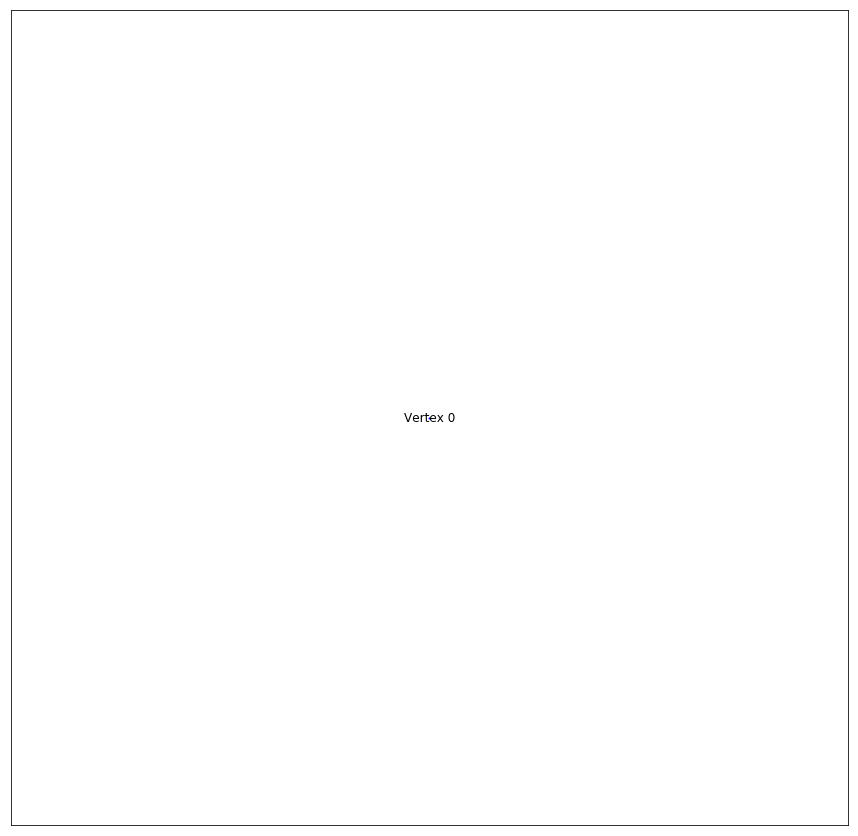

"NON-GROWTH"


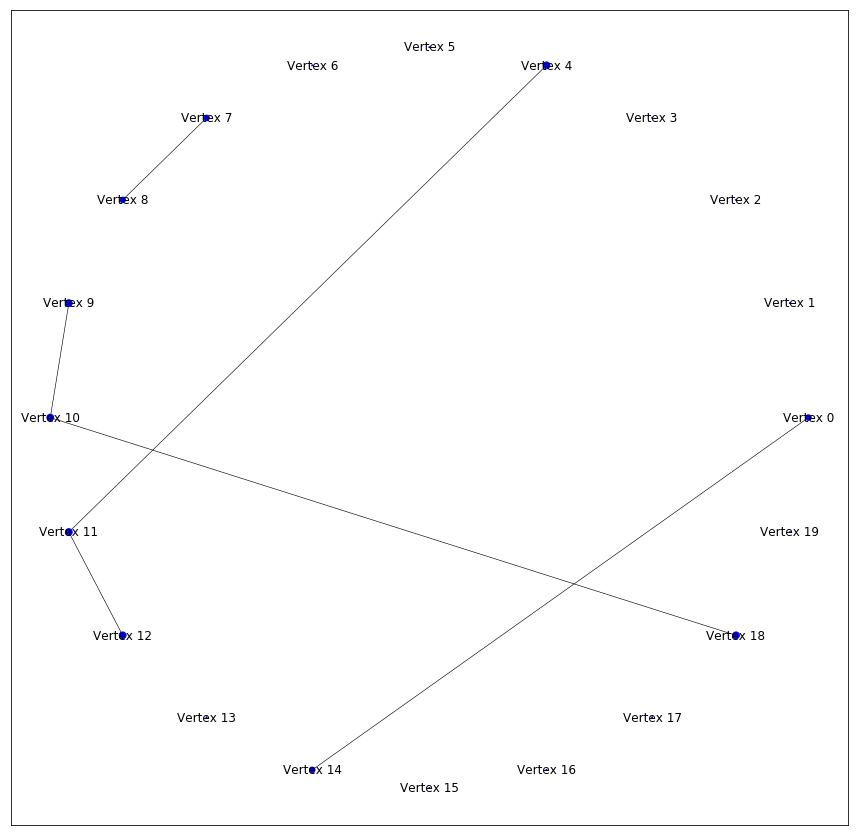

-----------------------------------------
proposals: {Vertex 0: [Vertex 1], Vertex 1: [Vertex 0]}
Vertex 0 degree 0 budget 0.0
[(1.0, 1.0, -0.08333333333333331)]
[0.9166666666666667]
[Vertex 1]
chose 0 (1.0, 1.0, -0.08333333333333331) 0.9166666666666667
chosen vtx Vertex 1
chose to add
###########################
Vertex 1 degree 1 budget 0.08333333333333331
Vertex 1 had no options
###########################
-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10

/usr/local/lib/python3.6/dist-packages/scipy/sparse/linalg/eigen/arpack/arpack.py:1269: RuntimeWarning: k >= N - 1 for N * N square matrix. Attempting to use scipy.linalg.eig instead.
  RuntimeWarning)


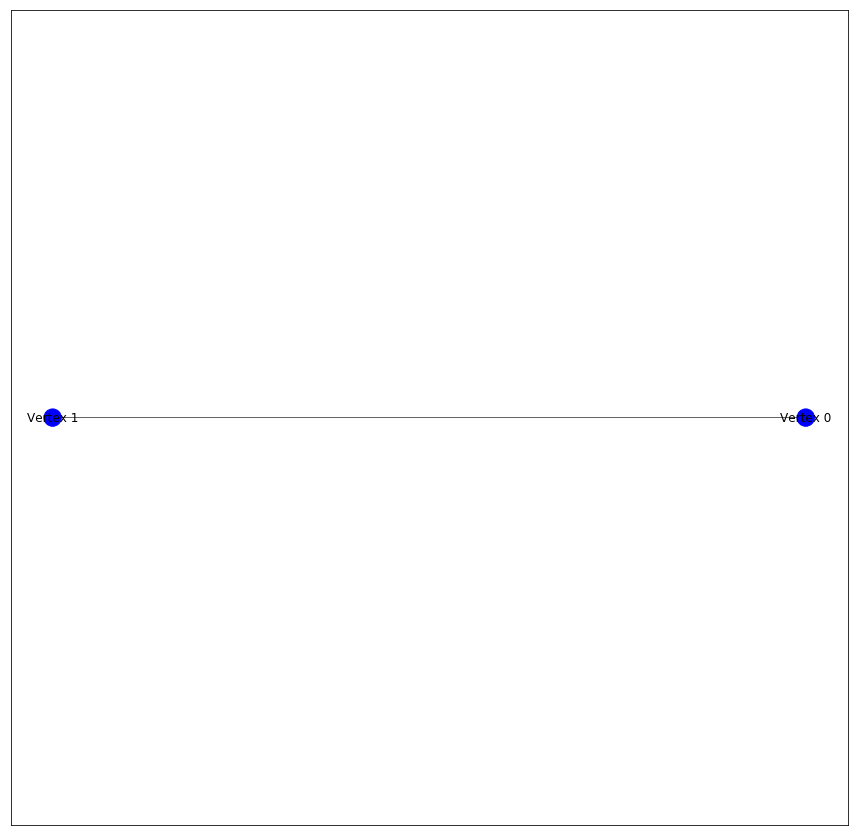

"NON-GROWTH"
Largest component size: [20]
graph density: [0.12105263157894737], 

average path length: 1.9684210526315788, 

diameter: 3, 

second eigenvalue: (1.0000000000000004+0j) 

total structural util: 18.299999999999994 

is bipartite: False 

avg nbor overlap: [8.25]



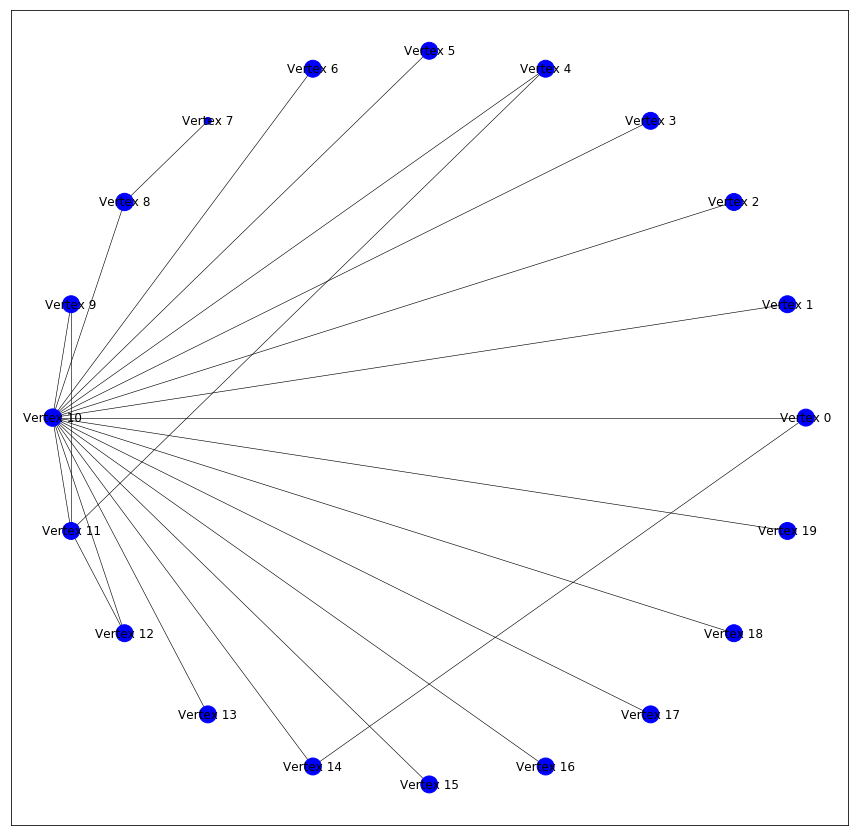

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2], Vertex 1: [Vertex 0, Vertex 2], Vertex 2: [Vertex 0, Vertex 1]}
Vertex 0 degree 1 budget 0.08333333333333331
[(1.0, 0.33333333333333337, -0.08333333333333331)]
[0.25000000000000006]
[Vertex 2]
chose 0 (1.0, 0.33333333333333337, -0.08333333333333331) 0.25000000000000006
chosen vtx Vertex 2
chose to add
###########################
Vertex 1 degree 1 budget 0.08333333333333331
[(0.6666666666666666, 0.0, -0.09027777777777776)]
[-0.09027777777777776]
[Vertex 2]
chose 0 (0.6666666666666666, 0.0, -0.09027777777777776) -0.09027777777777776
chosen vtx Vertex 2
chose do nothing
###########################
Vertex 2 degree 1 budget 0.08333333333333331
[(0.6666666666666666, 0.0, -0.09027777777777776)]
[-0.09027777777777776]
[Vertex 1]
chose 0 (0.6666666666666666, 0.0, -0.09027777777777776) -0.09027777777777776
chosen vtx Vertex 1
chose do nothing
###########################
-----------------------------------------

Vertex 7 degree 13 budget 1.083333333333333
[(-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.25, 0.08333333333333326), (-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.04999999999999993, 0.08333333333333326), (-0.1666666666666668, -0.25, 0.083333333333333

chose 9 (0.16666666666666666, 0.09999999999999998, -0.09027777777777773) 0.009722222222222243
chosen vtx Vertex 11
chose to add
###########################
Vertex 16 degree 2 budget 0.16666666666666663
[(0.6666666666666666, 0.04999999999999993, -0.08333333333333331), (0.16666666666666666, 0.0, -0.09722222222222221), (0.16666666666666666, 0.0, -0.09722222222222221), (0.12500000000000006, 0.0, -0.09722222222222221), (0.33333333333333337, 0.0, -0.09027777777777773), (0.33333333333333337, 0.0, -0.09722222222222221), (1.0, 0.0, -0.09722222222222221), (0.16666666666666666, 0.0, -0.09722222222222221), (0.16666666666666666, 0.04999999999999993, -0.08333333333333331), (1.0, 0.09999999999999998, -0.09027777777777773), (0.33333333333333337, 0.0, -0.09027777777777773), (0.16666666666666666, 0.0, -0.09027777777777773), (0.6666666666666666, 0.04999999999999993, -0.09027777777777773), (0.12500000000000006, 0.0, -0.09722222222222221), (0.16666666666666666, 0.0, -0.09722222222222221), (0.16666666666666

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5]}
Vertex 0 degree 5 budget 0.4166666666666666
[(0.39999999999999986, 0.1428571428571429, -0.08333333333333331)]
[0.05952380952380959]
[Vertex 6]
chose 0 (0.39999999999999986, 0.1428571428571429, -0.08333333333333331) 0.05952380952380959
chosen vtx Vertex 6
chose to add
###########################
Vertex 1 degree 1 budget 0.08333333333333331
[(0.39999999999999997, 0.0, -0.09027777777777776), (0.5, 0.0, -0.09027777777777776), (0.5, 0.0, -0.09

"GROWTH"
Largest component size: [7]
graph density: [0.2857142857142857], 

average path length: 1.7142857142857142, 

diameter: 2, 

second eigenvalue: (0.9999999999999996+0j) 

total structural util: 7.0 

is bipartite: True 

avg nbor overlap: [2.142857142857143]



/usr/local/lib/python3.6/dist-packages/scipy/sparse/linalg/eigen/arpack/arpack.py:1269: RuntimeWarning: k >= N - 1 for N * N square matrix. Attempting to use scipy.linalg.eig instead.
  RuntimeWarning)


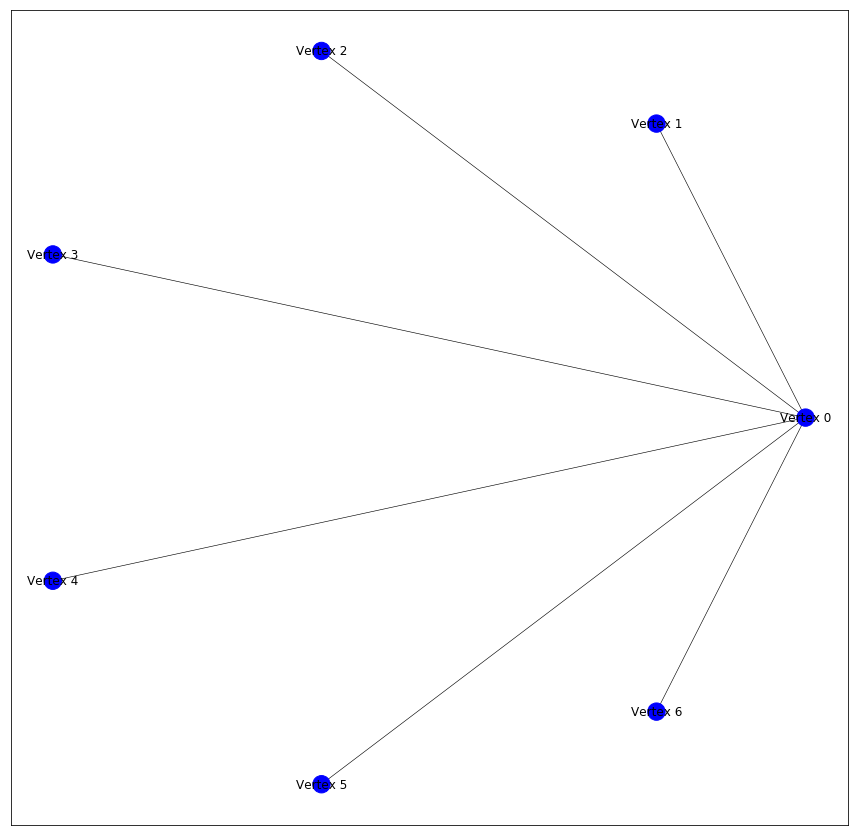

"NON-GROWTH"
Largest component size: [20]
graph density: [0.21578947368421053], 

average path length: 1.8105263157894738, 

diameter: 3, 

second eigenvalue: (1.1325997901170477+0j) 

total structural util: 19.499999999999996 

is bipartite: False 

avg nbor overlap: [14.0]



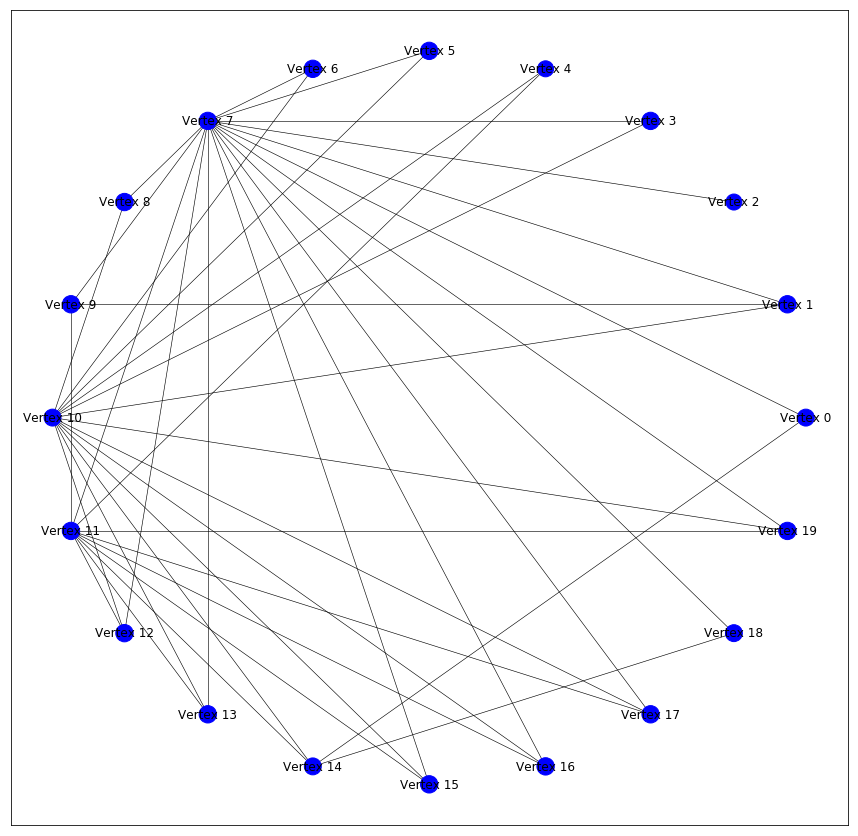

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 7], Vertex 7: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6]}
Vertex 0 degree 6 budget 0.4999999999999999
[(0.3999999999999999, 0.125, -0.08333333333333337)]
[0.04166666666666663]
[Vertex 7]
chose 0 (0.3999999999999999, 0.125, -0.08333333333333337) 0.04166666666666663
chosen vtx Vertex 7
chose to add
###########################
Vertex 1 degree 1 budg

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 7, Vertex 8], Vertex 7: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 8], Vertex 8: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7]}
Vertex 0 degree 7 budget 0.5833333333333333
[(0.3333333333333333, 0.11111111111111116, -0.08333333333333326)]
[0.02777

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 7, Vertex 8, Vertex 9], Vertex 7: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 8, Vertex 9], Vertex 8: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 9], Vertex 9: [Vertex 0, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 7, Vertex 8, Vertex 9, Vertex 10], Vertex 7: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 8, Vertex 9, Vertex 10], Vertex 8: [Vertex 0, Vertex 1, Vertex 2, V

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11], Vertex 7: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 

"GROWTH"
Largest component size: [12]
graph density: [0.30303030303030304], 

average path length: 1.696969696969697, 

diameter: 2, 

second eigenvalue: (0.9999999999999998+0j) 

total structural util: 12.0 

is bipartite: True 

avg nbor overlap: [8.333333333333334]



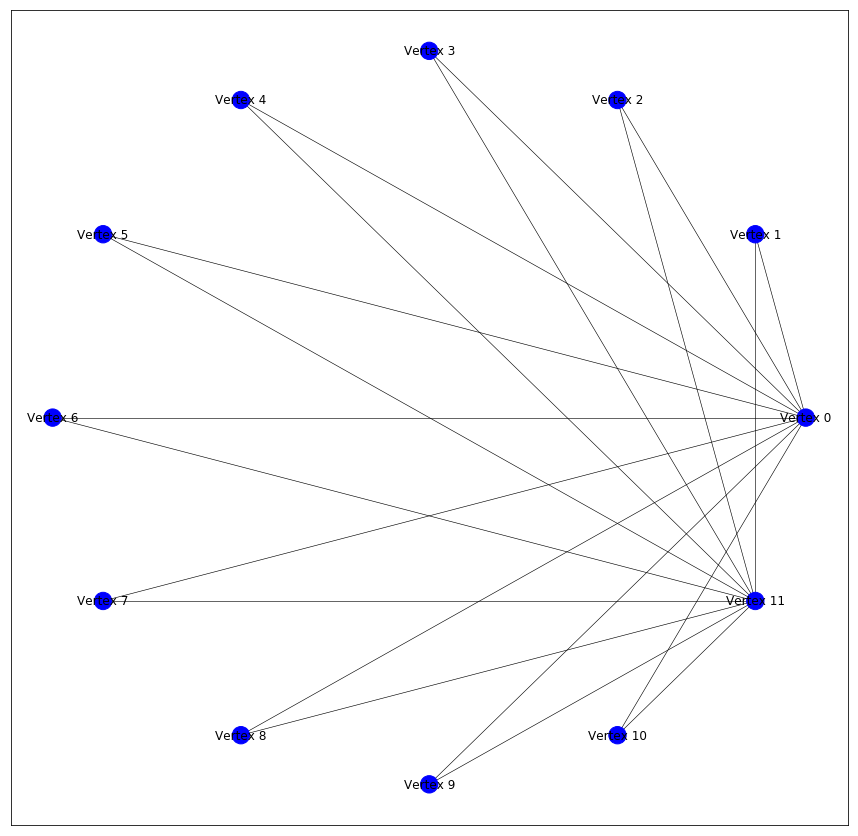

"NON-GROWTH"
Largest component size: [20]
graph density: [0.24736842105263157], 

average path length: 1.7578947368421052, 

diameter: 3, 

second eigenvalue: (1.2558720427225898+0j) 

total structural util: 19.9 

is bipartite: False 

avg nbor overlap: [14.25]



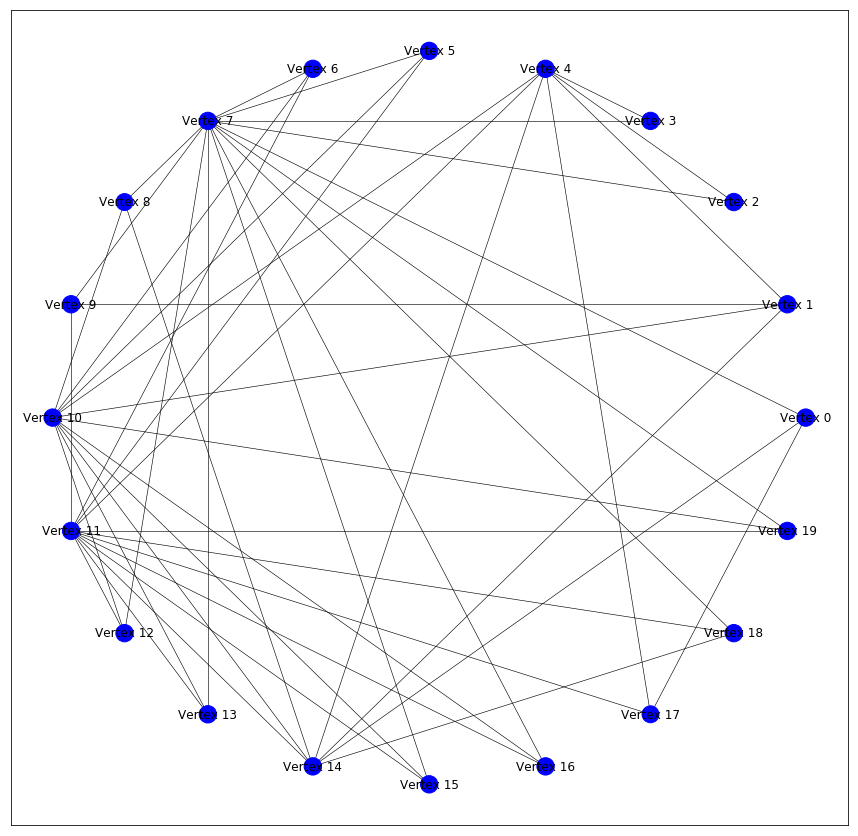

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12], V

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5,

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14], Vert

###########################
Vertex 10 degree 9 budget 0.7569444444444442
[(0.1666666666666668, 0.050000000000000044, -0.09027777777777779), (0.1666666666666668, 0.050000000000000044, -0.08333333333333337), (0.1666666666666668, 0.050000000000000044, -0.08333333333333337), (0.1666666666666668, 0.0, -0.09027777777777779), (0.1666666666666668, 0.0, -0.09027777777777779), (0.1666666666666668, 0.050000000000000044, -0.13194444444444453), (0.1666666666666668, 0.050000000000000044, -0.08333333333333337), (0.1666666666666668, 0.0, -0.09027777777777779)]
[-0.040277777777777746, -0.033333333333333326, -0.033333333333333326, -0.09027777777777779, -0.09027777777777779, -0.08194444444444449, -0.033333333333333326, -0.09027777777777779]
[Vertex 0, Vertex 2, Vertex 3, Vertex 8, Vertex 9, Vertex 11, Vertex 17, Vertex 18]
chose 1 (0.1666666666666668, 0.050000000000000044, -0.08333333333333337) -0.033333333333333326
chosen vtx Vertex 2
chose do nothing
###########################
Vertex 11 degree 11 budg

-----------------------------------------
proposals: {Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 7, Vertex 8, Vertex 9, Verte

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, 

Vertex 16 degree 4 budget 0.3402777777777777
[(0.6666666666666667, 0.0, -0.09027777777777779), (0.1666666666666668, 0.0, -0.09722222222222221), (0.1666666666666668, 0.0, -0.09722222222222221), (0.125, 0.0, -0.09027777777777779), (0.3333333333333332, 0.0, -0.10416666666666669), (1.0, 0.0, -0.09722222222222221), (0.1666666666666668, 0.0, -0.09722222222222221), (0.1666666666666668, 0.0, -0.09722222222222221), (0.3333333333333332, 0.0, -0.10416666666666669), (0.1666666666666668, 0.0, -0.1111111111111111), (0.6666666666666667, 0.0, -0.09027777777777779), (0.125, 0.0, -0.1111111111111111), (0.1666666666666668, 0.0, -0.09722222222222221), (0.1666666666666668, 0.0, -0.09722222222222221), (0.125, 0.0, -0.10416666666666669)]
[-0.09027777777777779, -0.09722222222222221, -0.09722222222222221, -0.09027777777777779, -0.10416666666666669, -0.09722222222222221, -0.09722222222222221, -0.09722222222222221, -0.10416666666666669, -0.1111111111111111, -0.09027777777777779, -0.1111111111111111, -0.097222222

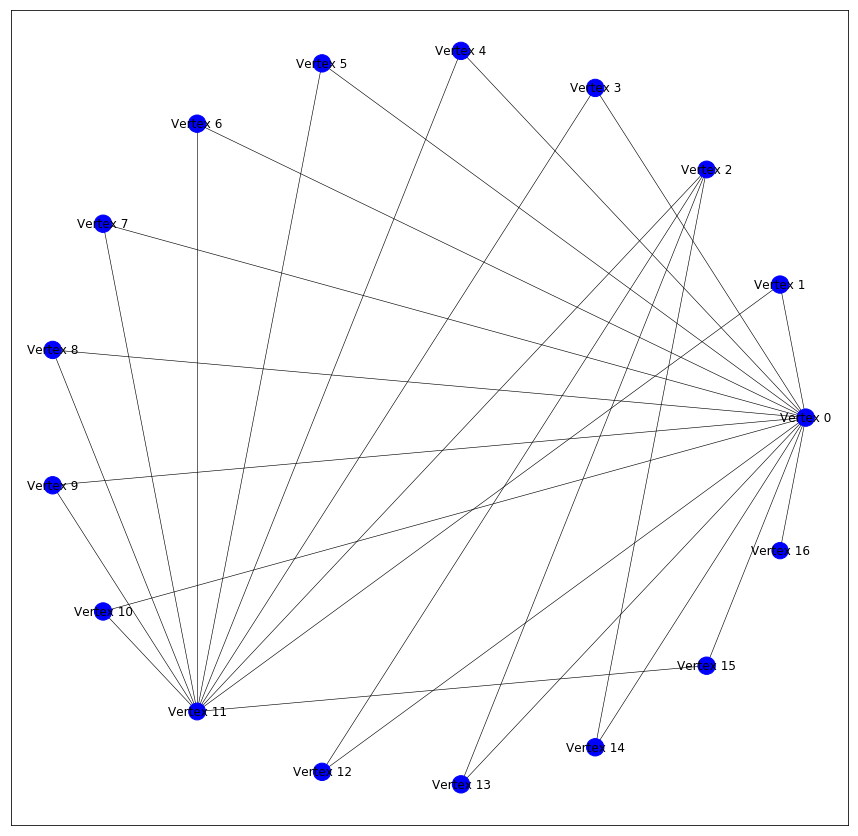

"NON-GROWTH"
Largest component size: [20]
graph density: [0.25263157894736843], 

average path length: 1.7947368421052632, 

diameter: 3, 

second eigenvalue: (1.371581490658211+0j) 

total structural util: 19.099999999999994 

is bipartite: False 

avg nbor overlap: [12.85]



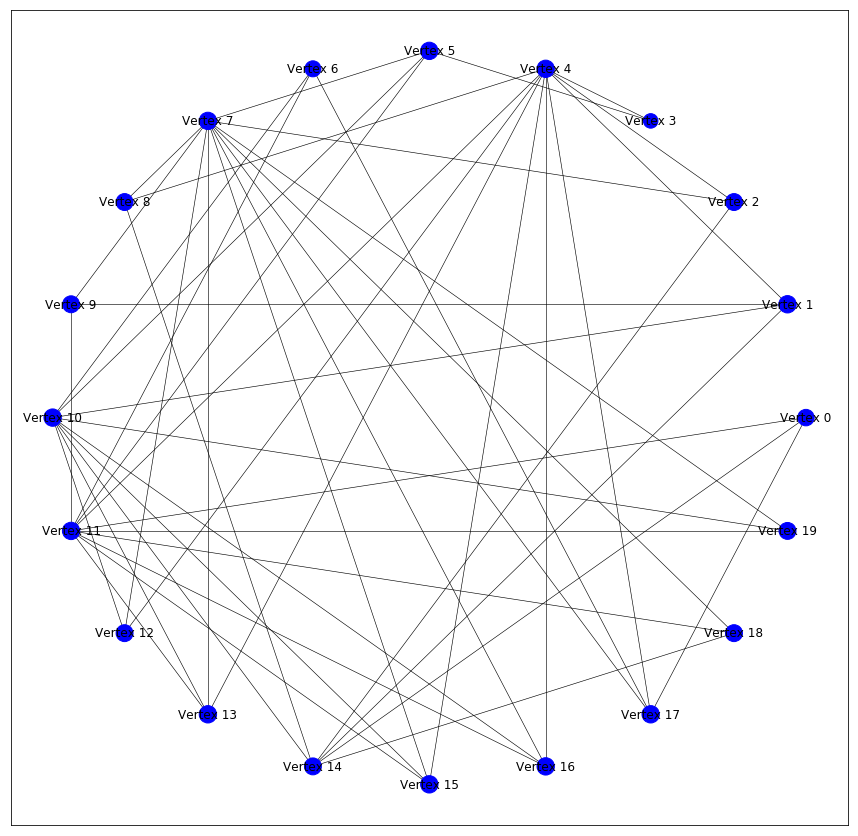

-----------------------------------------
proposals: {Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 1

Vertex 8 degree 3 budget 0.24999999999999994
[(0.16666666666666669, 0.0, -0.09027777777777773), (0.16666666666666669, 0.0, -0.09722222222222221), (0.16666666666666669, 0.0, -0.10416666666666663), (0.125, 0.0, -0.09027777777777773), (0.16666666666666669, 0.0, -0.09027777777777773), (0.16666666666666669, 0.050000000000000044, -0.08333333333333331), (0.16666666666666669, 0.0, -0.09027777777777773), (0.16666666666666669, 0.050000000000000044, -0.09027777777777773), (0.16666666666666669, 0.050000000000000044, -0.09027777777777773), (0.16666666666666669, 0.0, -0.09722222222222221), (0.16666666666666669, 0.0, -0.09722222222222221), (0.16666666666666669, 0.0, -0.09722222222222221), (0.16666666666666669, 0.0, -0.09722222222222221), (0.16666666666666669, 0.050000000000000044, -0.09722222222222221), (0.16666666666666669, 0.0, -0.09722222222222221), (0.125, 0.0, -0.09027777777777773)]
[-0.09027777777777773, -0.09722222222222221, -0.10416666666666663, -0.09027777777777773, -0.09027777777777773, -0.

-----------------------------------------
proposals: {Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 1

Vertex 7 degree 12 budget 1.0069444444444442
[(-0.1666666666666668, -0.09999999999999998, 0.08333333333333326), (-0.1666666666666668, -0.050000000000000044, 0.08333333333333326), (-0.1666666666666668, -0.09999999999999998, 0.08333333333333326), (-0.1666666666666668, -0.050000000000000044, 0.08333333333333326), (-0.1666666666666668, -0.050000000000000044, 0.08333333333333326), (-0.1666666666666668, -0.050000000000000044, 0.08333333333333326), (-0.1666666666666668, -0.050000000000000044, 0.08333333333333326), (-0.1666666666666668, -0.050000000000000044, 0.08333333333333326), (-0.1666666666666668, -0.050000000000000044, 0.08333333333333326), (-0.1666666666666668, -0.050000000000000044, 0.08333333333333326), (-0.1666666666666668, -0.050000000000000044, 0.09027777777777768), (-0.1666666666666668, 0.0, 0.09027777777777768), (-0.1666666666666668, -0.09999999999999998, 0.08333333333333326), (-0.1666666666666668, -0.050000000000000044, 0.08333333333333326), (-0.1666666666666668, -0.099999999999

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 

chosen vtx Vertex 3
chose do nothing
###########################
Vertex 2 degree 3 budget 0.24999999999999994
[(0.16666666666666669, 0.0, -0.09722222222222221), (0.125, 0.0, -0.09722222222222221), (0.6666666666666667, 0.0, -0.09027777777777773), (0.16666666666666669, 0.0, -0.09027777777777773), (0.125, 0.050000000000000044, -0.08333333333333331), (0.16666666666666669, 0.0, -0.10416666666666663), (0.16666666666666669, 0.0, -0.09027777777777773), (0.16666666666666669, 0.050000000000000044, -0.09027777777777773), (0.16666666666666669, 0.050000000000000044, -0.09027777777777773), (0.16666666666666669, 0.0, -0.09722222222222221), (0.16666666666666669, 0.0, -0.09722222222222221), (0.6666666666666667, 0.0, -0.09722222222222221), (0.16666666666666669, 0.0, -0.09722222222222221), (0.16666666666666669, 0.050000000000000044, -0.09722222222222221), (0.125, 0.0, -0.09722222222222221), (0.125, 0.0, -0.09027777777777773)]
[-0.09722222222222221, -0.09722222222222221, -0.09027777777777773, -0.090277777

-----------------------------------------
proposals: {Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

"GROWTH"
Largest component size: [20]
graph density: [0.18421052631578946], 

average path length: 1.8631578947368421, 

diameter: 3, 

second eigenvalue: (1+0j) 

total structural util: 19.099999999999998 

is bipartite: False 

avg nbor overlap: [10.55]



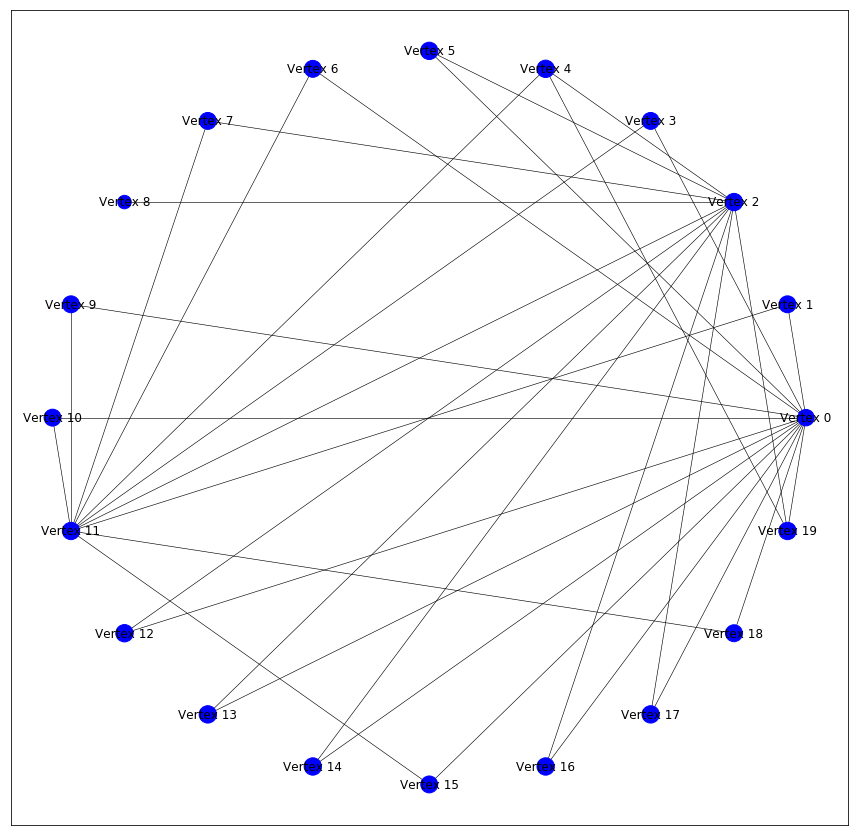

"NON-GROWTH"
Largest component size: [20]
graph density: [0.25263157894736843], 

average path length: 1.7947368421052632, 

diameter: 3, 

second eigenvalue: (1.3715814906582144+0j) 

total structural util: 19.099999999999994 

is bipartite: False 

avg nbor overlap: [12.85]



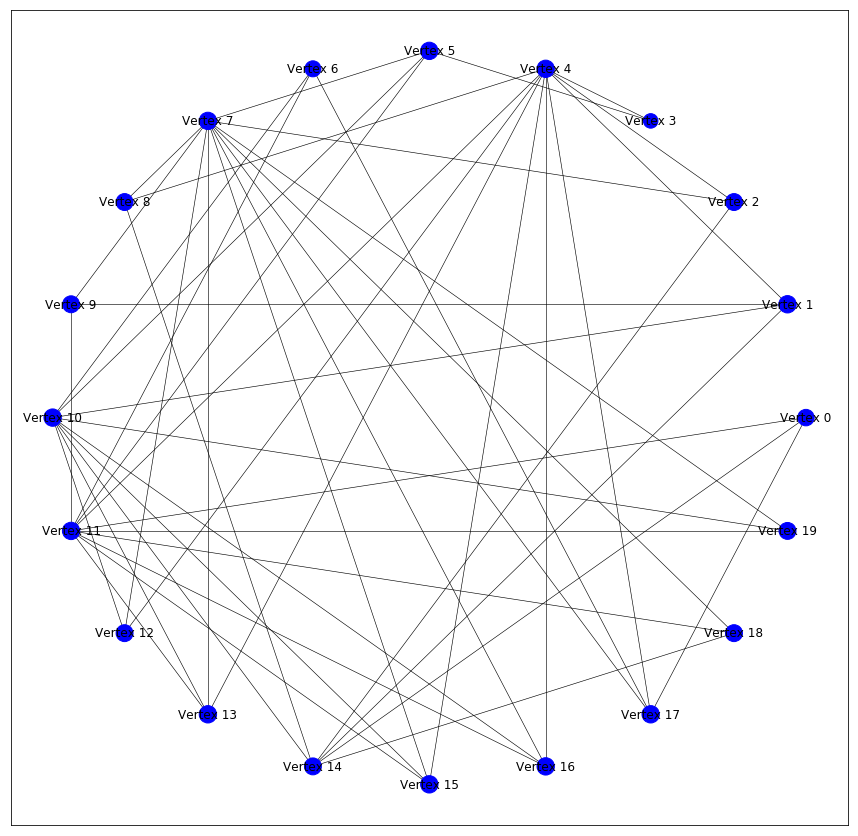

-----------------------------------------
proposals: {Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

"GROWTH"
Largest component size: [20]
graph density: [0.22631578947368422], 

average path length: 1.8, 

diameter: 3, 

second eigenvalue: (1.081980482101882+0j) 

total structural util: 19.499999999999996 

is bipartite: False 

avg nbor overlap: [14.35]



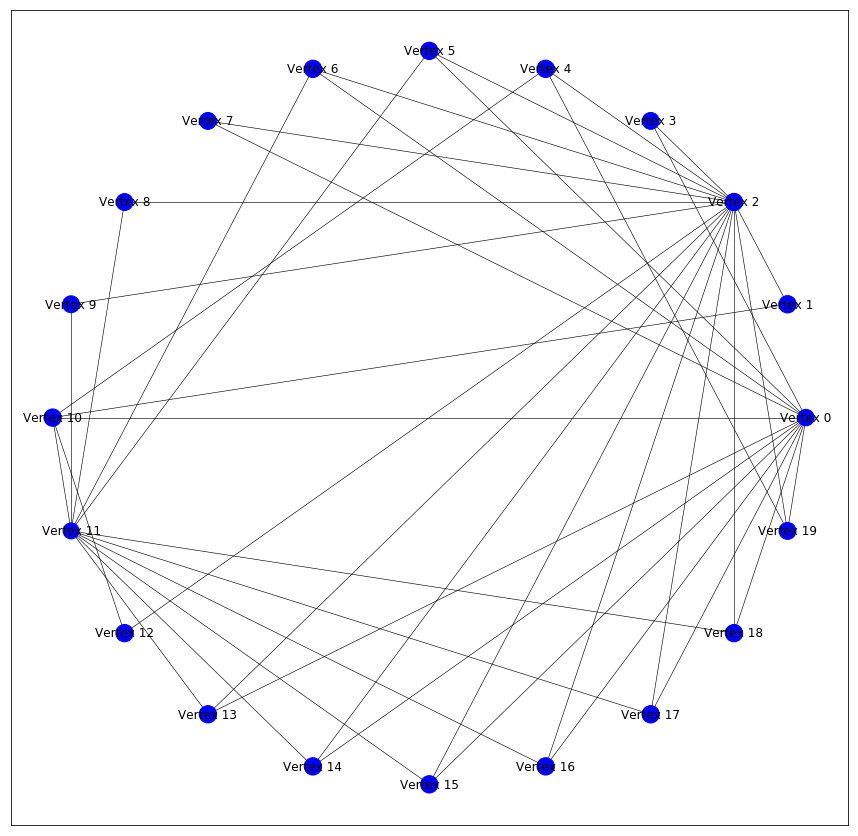

"NON-GROWTH"
Largest component size: [20]
graph density: [0.25263157894736843], 

average path length: 1.7947368421052632, 

diameter: 3, 

second eigenvalue: (1.371581490658215+0j) 

total structural util: 19.099999999999994 

is bipartite: False 

avg nbor overlap: [12.85]



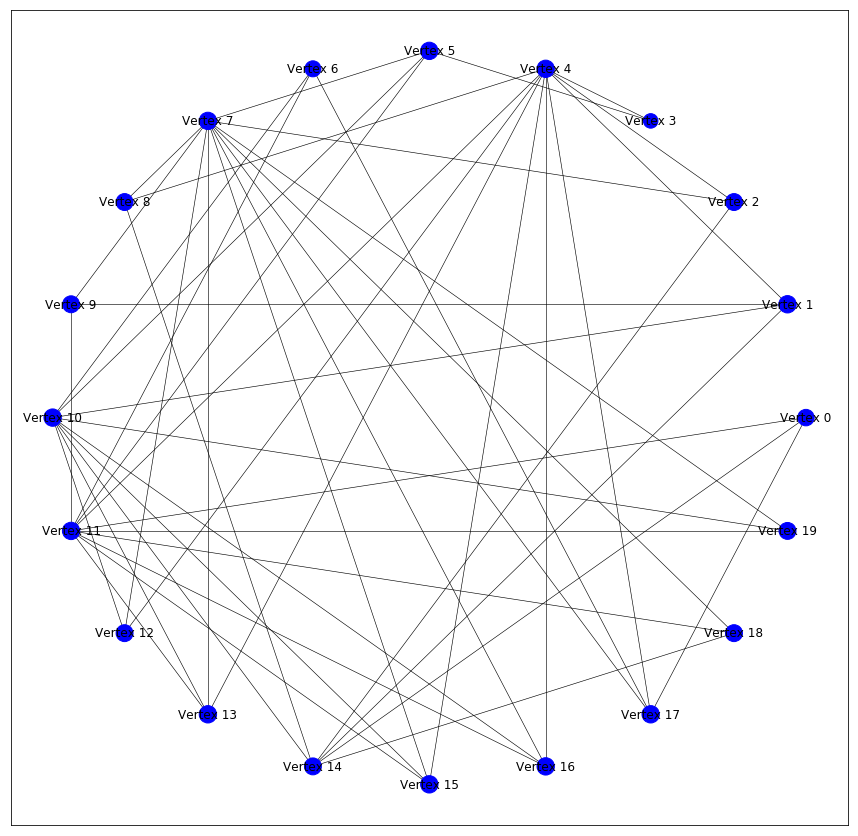

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 

###########################
Vertex 5 degree 4 budget 0.3402777777777777
[(0.3333333333333333, 0.0, -0.09027777777777779), (0.16666666666666669, 0.0, -0.09027777777777779), (0.16666666666666669, 0.0, -0.09027777777777779), (0.6666666666666667, 0.0, -0.09722222222222221), (0.3333333333333333, 0.0, -0.09722222222222221), (0.16666666666666669, 0.0, -0.09027777777777779), (0.16666666666666669, 0.0, -0.09722222222222221), (0.3333333333333333, 0.0, -0.09722222222222221), (0.16666666666666669, 0.0, -0.10416666666666669), (0.16666666666666669, 0.0, -0.09027777777777779), (0.16666666666666669, 0.0, -0.10416666666666669), (0.3333333333333333, 0.0, -0.10416666666666669), (0.16666666666666669, 0.0, -0.09027777777777779), (0.6666666666666667, 0.0, -0.09722222222222221), (0.125, 0.0, -0.10416666666666669)]
[-0.09027777777777779, -0.09027777777777779, -0.09027777777777779, -0.09722222222222221, -0.09722222222222221, -0.09027777777777779, -0.09722222222222221, -0.09722222222222221, -0.10416666666666669

-----------------------------------------
proposals: {Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 5: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 6: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

"GROWTH"
Largest component size: [20]
graph density: [0.25263157894736843], 

average path length: 1.7473684210526317, 

diameter: 2, 

second eigenvalue: (1.2886751345948126+0j) 

total structural util: 20.0 

is bipartite: False 

avg nbor overlap: [14.05]



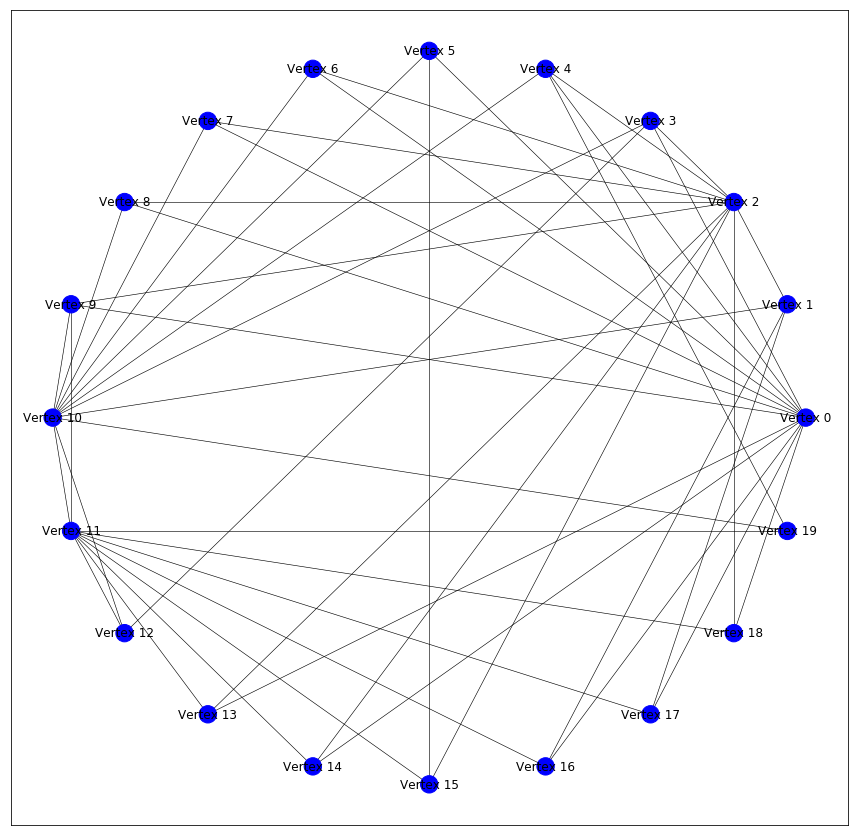

"NON-GROWTH"
Largest component size: [20]
graph density: [0.25263157894736843], 

average path length: 1.7947368421052632, 

diameter: 3, 

second eigenvalue: (1.3715814906582176+0j) 

total structural util: 19.099999999999994 

is bipartite: False 

avg nbor overlap: [12.85]



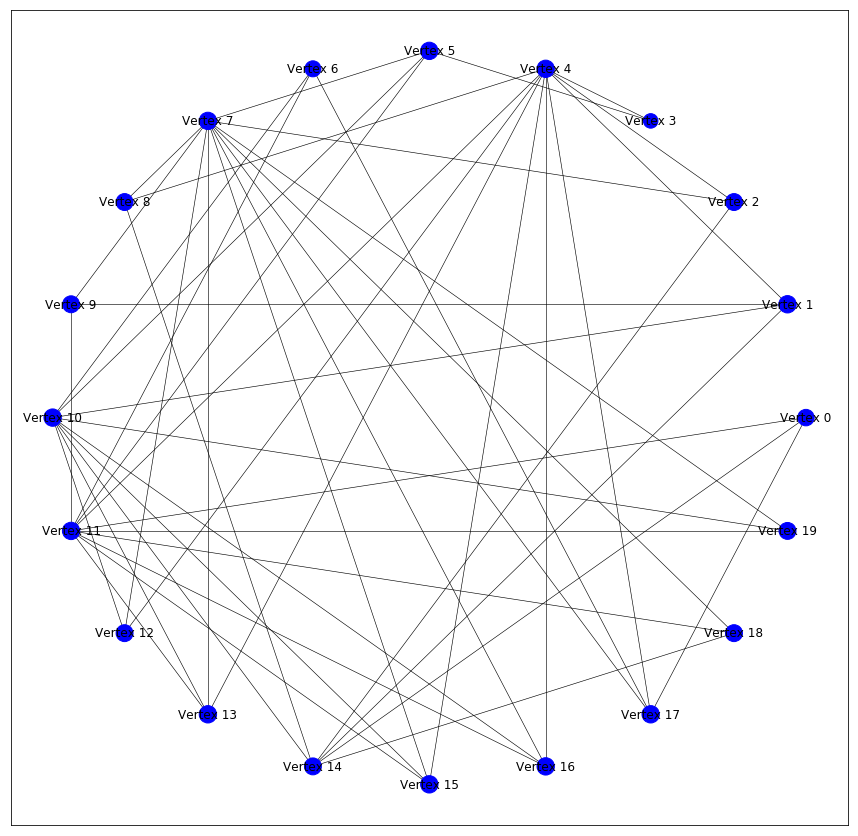

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

"GROWTH"
Largest component size: [20]
graph density: [0.25263157894736843], 

average path length: 1.7473684210526317, 

diameter: 2, 

second eigenvalue: (1.2886751345948124+0j) 

total structural util: 20.0 

is bipartite: False 

avg nbor overlap: [14.05]



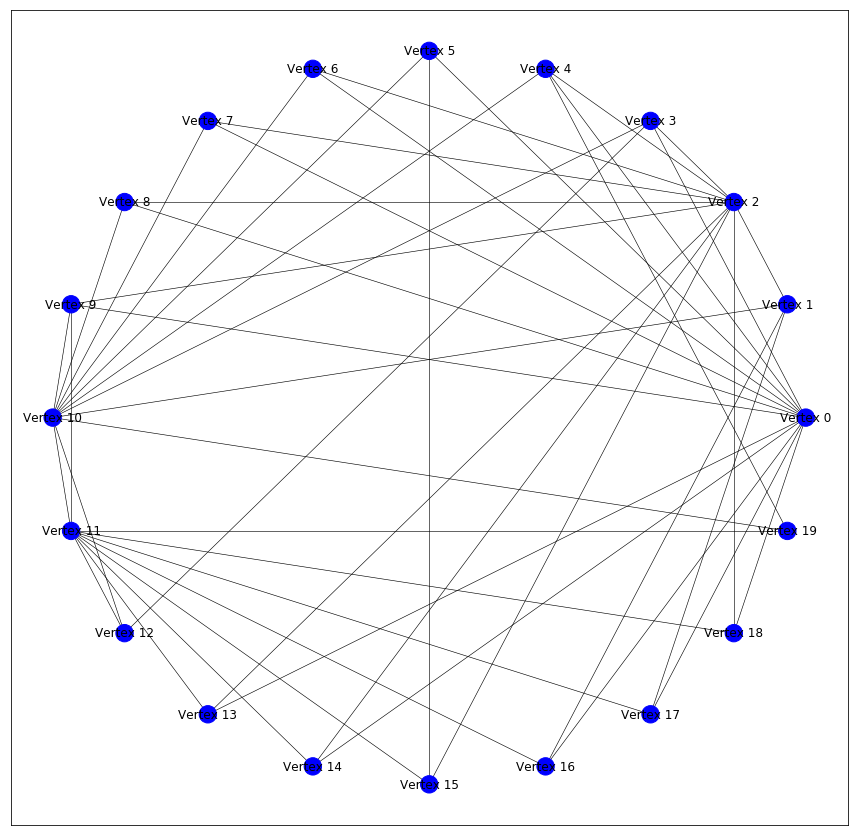

"NON-GROWTH"
Largest component size: [20]
graph density: [0.25263157894736843], 

average path length: 1.7947368421052632, 

diameter: 3, 

second eigenvalue: (1.3715814906582133+0j) 

total structural util: 19.099999999999994 

is bipartite: False 

avg nbor overlap: [12.85]



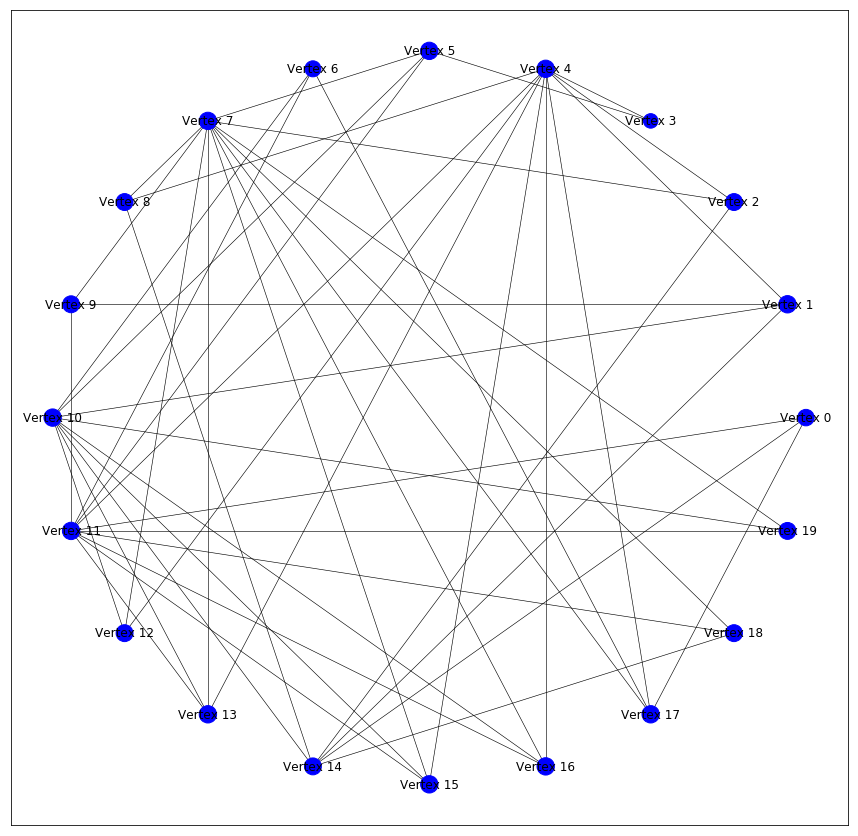

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

Vertex 0 degree 3 budget 0.24999999999999994
[(0.1666666666666666, 0.0, -0.09027777777777773), (0.1666666666666666, 0.0, -0.09027777777777773), (0.125, 0.04999999999999993, -0.08333333333333331), (0.33333333333333337, 0.09999999999999998, -0.09722222222222221), (0.33333333333333337, 0.04999999999999993, -0.09027777777777773), (0.33333333333333337, 0.0, -0.09722222222222221), (0.1666666666666666, 0.04999999999999993, -0.09027777777777773), (0.1666666666666666, 0.0, -0.09027777777777773), (0.1666666666666666, 0.0, -0.09027777777777773), (0.1666666666666666, 0.04999999999999993, -0.09027777777777773), (0.33333333333333337, 0.04999999999999993, -0.08333333333333331), (0.1666666666666666, 0.0, -0.09027777777777773), (0.1666666666666666, 0.0, -0.09027777777777773), (0.6666666666666667, 0.0, -0.09027777777777773), (0.1666666666666666, 0.0, -0.09722222222222221), (0.125, 0.0, -0.09027777777777773)]
[-0.09027777777777773, -0.09027777777777773, -0.03333333333333338, 0.002777777777777768, -0.0402

"GROWTH"
Largest component size: [20]
graph density: [0.24736842105263157], 

average path length: 1.7578947368421052, 

diameter: 3, 

second eigenvalue: (1.2886751345948113+0j) 

total structural util: 19.9 

is bipartite: False 

avg nbor overlap: [13.35]



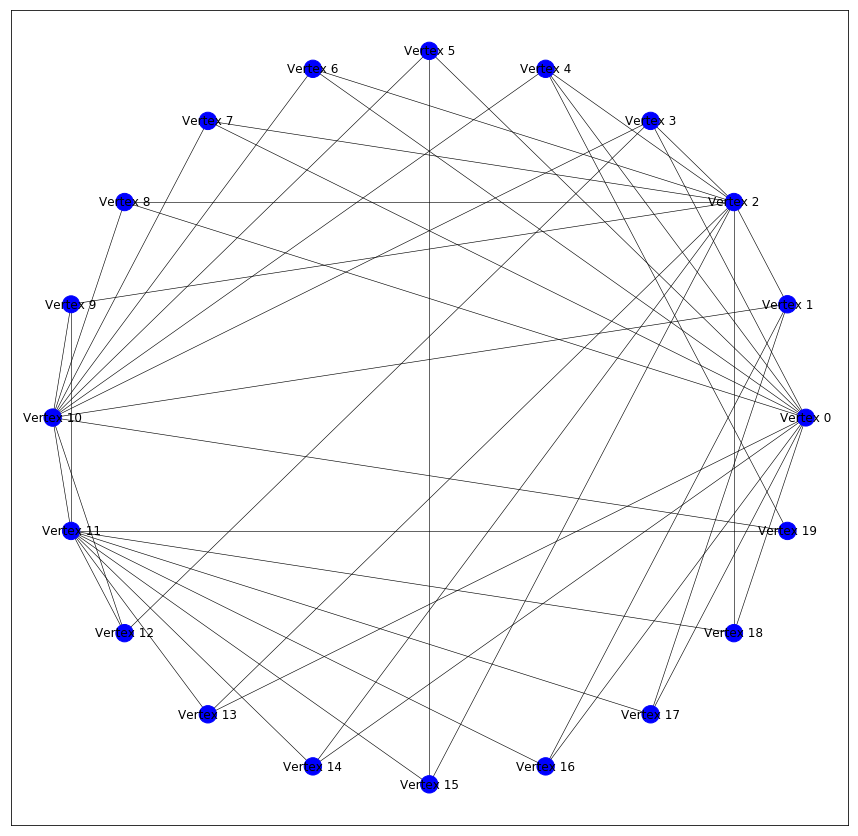

"NON-GROWTH"
Largest component size: [20]
graph density: [0.25263157894736843], 

average path length: 1.7947368421052632, 

diameter: 3, 

second eigenvalue: (1.3715814906582133+0j) 

total structural util: 19.099999999999994 

is bipartite: False 

avg nbor overlap: [12.85]



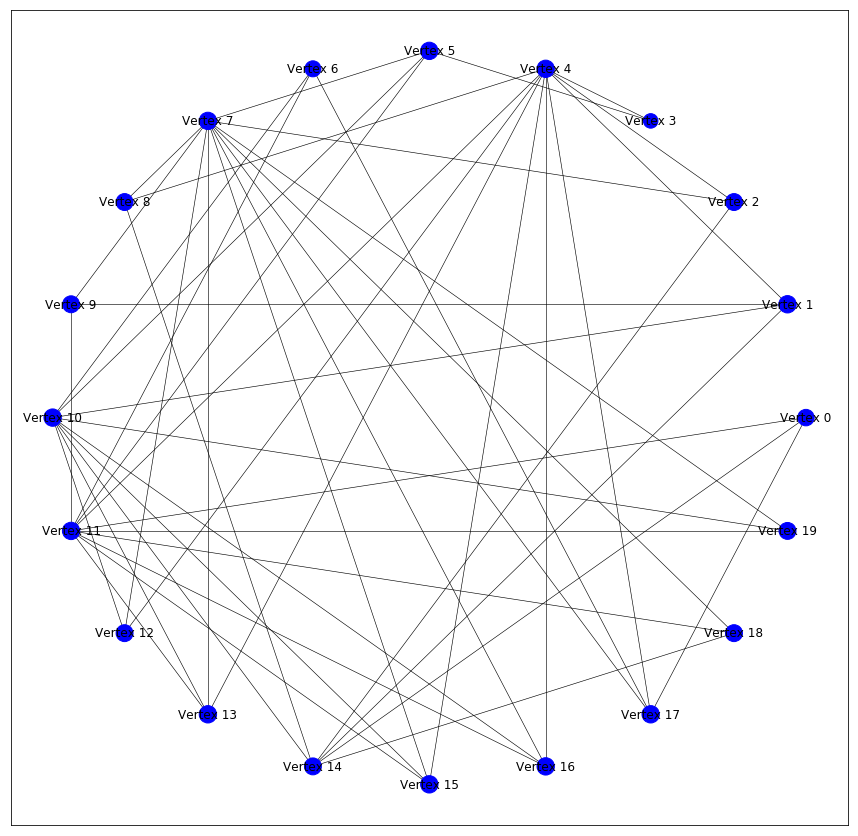

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

"GROWTH"
Largest component size: [20]
graph density: [0.24736842105263157], 

average path length: 1.7578947368421052, 

diameter: 3, 

second eigenvalue: (1.2886751345948126+0j) 

total structural util: 19.9 

is bipartite: False 

avg nbor overlap: [13.35]



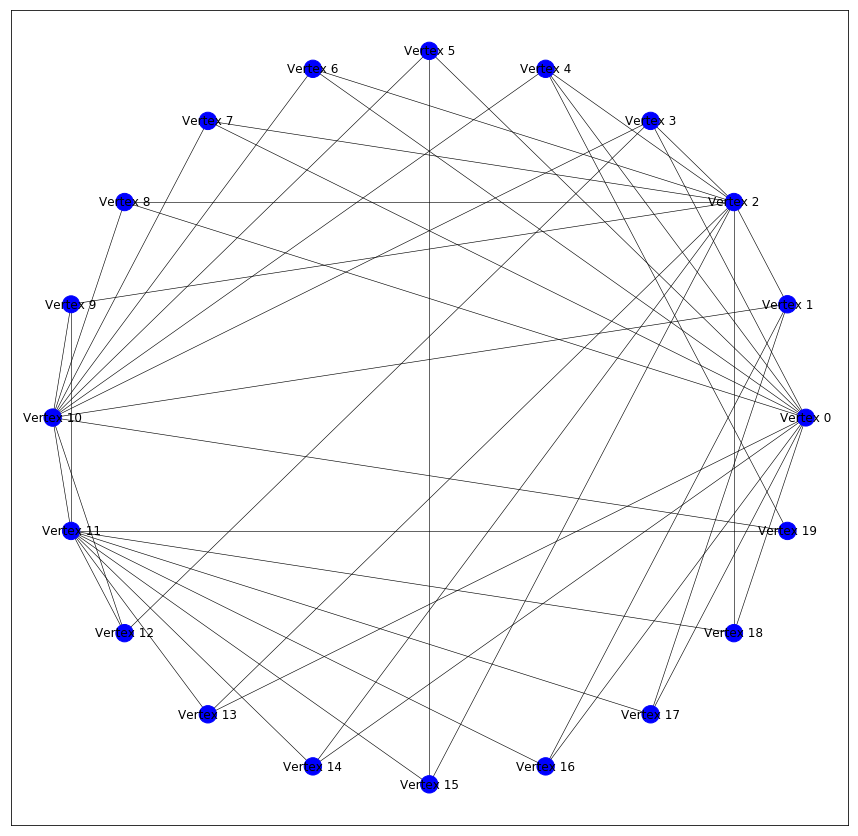

"NON-GROWTH"
Largest component size: [20]
graph density: [0.25263157894736843], 

average path length: 1.7947368421052632, 

diameter: 3, 

second eigenvalue: (1.3715814906582109+0j) 

total structural util: 19.099999999999994 

is bipartite: False 

avg nbor overlap: [12.85]



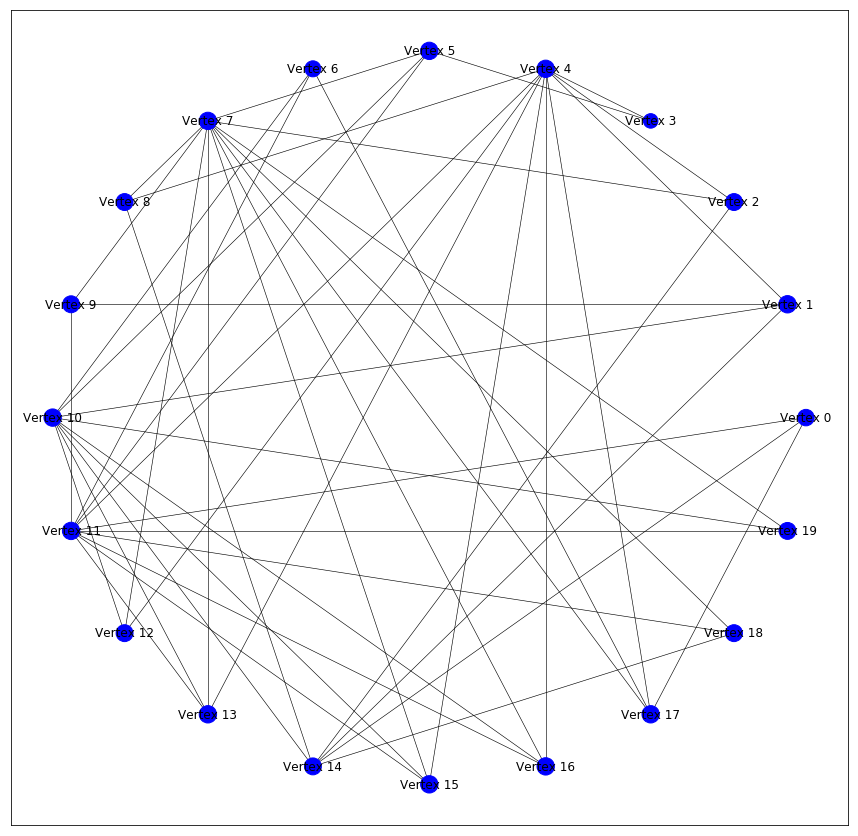

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

"GROWTH"
Largest component size: [20]
graph density: [0.24736842105263157], 

average path length: 1.7578947368421052, 

diameter: 3, 

second eigenvalue: (1.2886751345948144+0j) 

total structural util: 19.9 

is bipartite: False 

avg nbor overlap: [13.35]



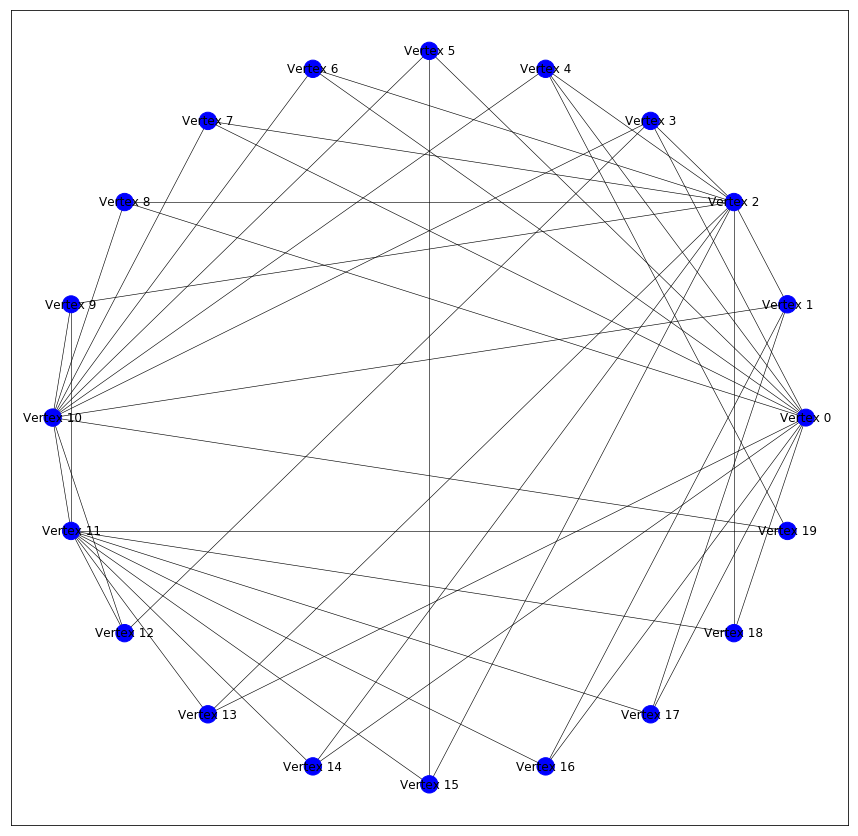

"NON-GROWTH"
Largest component size: [20]
graph density: [0.25263157894736843], 

average path length: 1.7947368421052632, 

diameter: 3, 

second eigenvalue: (1.3715814906582138+0j) 

total structural util: 19.099999999999994 

is bipartite: False 

avg nbor overlap: [12.85]



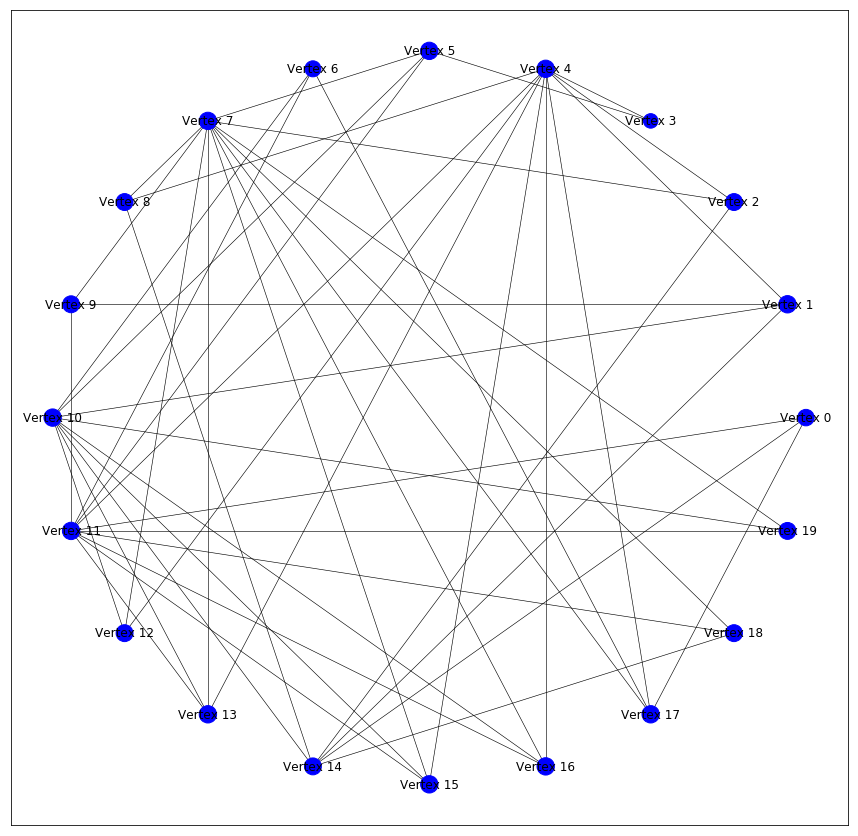

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

"GROWTH"
Largest component size: [20]
graph density: [0.24736842105263157], 

average path length: 1.7578947368421052, 

diameter: 3, 

second eigenvalue: (1.288675134594813+0j) 

total structural util: 19.9 

is bipartite: False 

avg nbor overlap: [13.35]



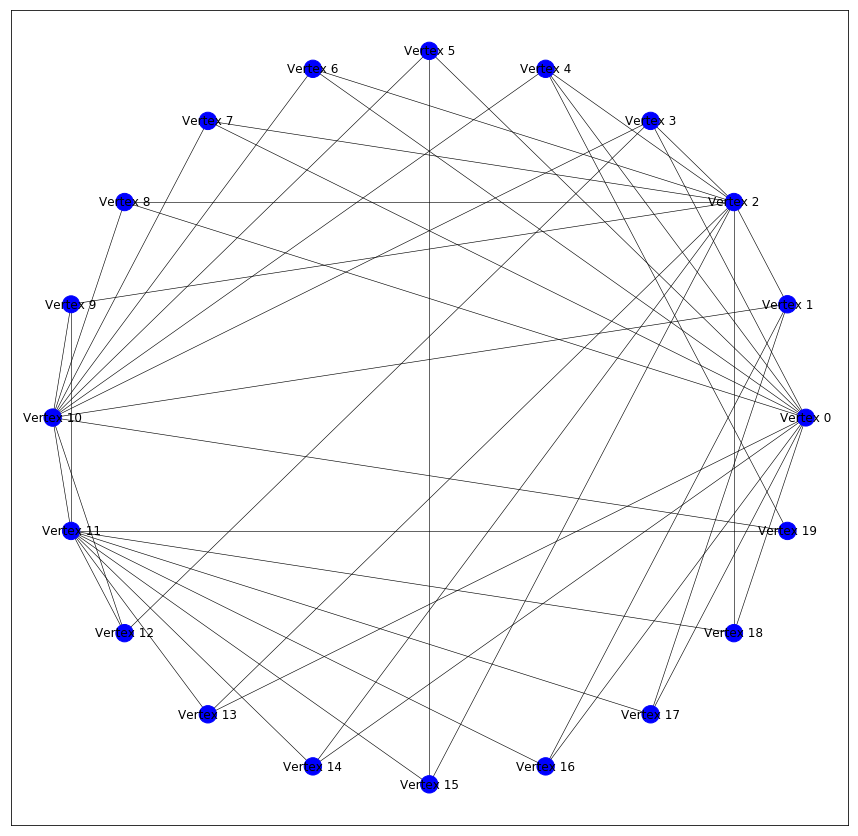

"NON-GROWTH"
Largest component size: [20]
graph density: [0.25263157894736843], 

average path length: 1.7947368421052632, 

diameter: 3, 

second eigenvalue: (1.3715814906582116+0j) 

total structural util: 19.099999999999994 

is bipartite: False 

avg nbor overlap: [12.85]



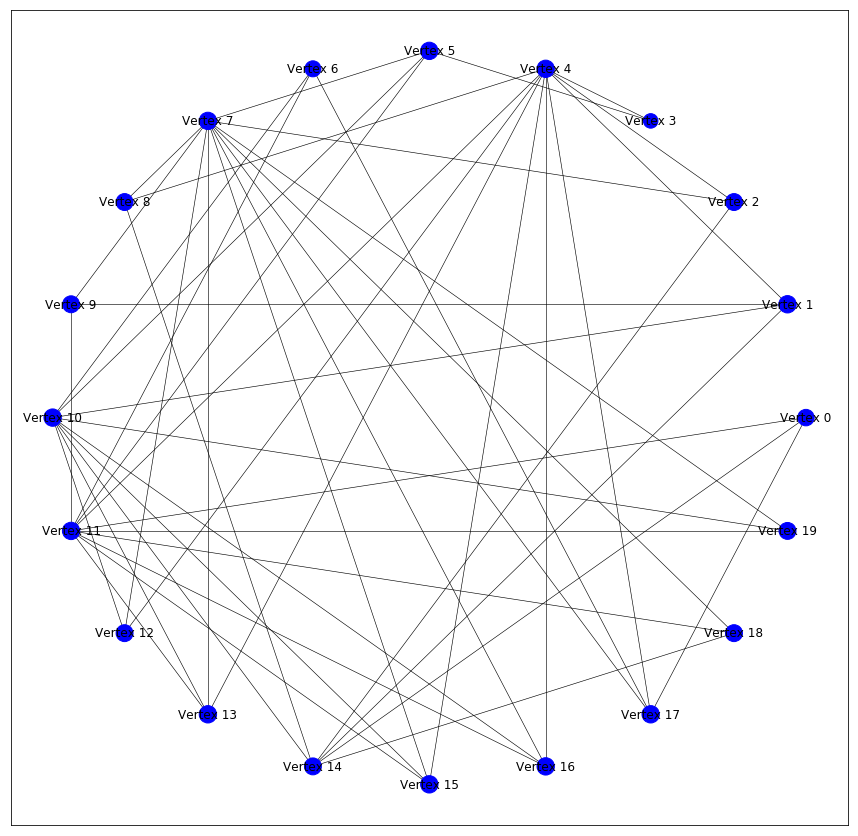

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

-----------------------------------------
proposals: {Vertex 0: [Vertex 1, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 1: [Vertex 0, Vertex 2, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 2: [Vertex 0, Vertex 1, Vertex 3, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 3: [Vertex 0, Vertex 1, Vertex 2, Vertex 4, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 9, Vertex 10, Vertex 11, Vertex 12, Vertex 13, Vertex 14, Vertex 15, Vertex 16, Vertex 17, Vertex 18, Vertex 19], Vertex 4: [Vertex 0, Vertex 1, Vertex 2, Vertex 3, Vertex 5, Vertex 6, Vertex 7, Vertex 8, Vertex 

"GROWTH"
Largest component size: [20]
graph density: [0.24736842105263157], 

average path length: 1.7578947368421052, 

diameter: 3, 

second eigenvalue: (1.2886751345948095+0j) 

total structural util: 19.9 

is bipartite: False 

avg nbor overlap: [13.35]



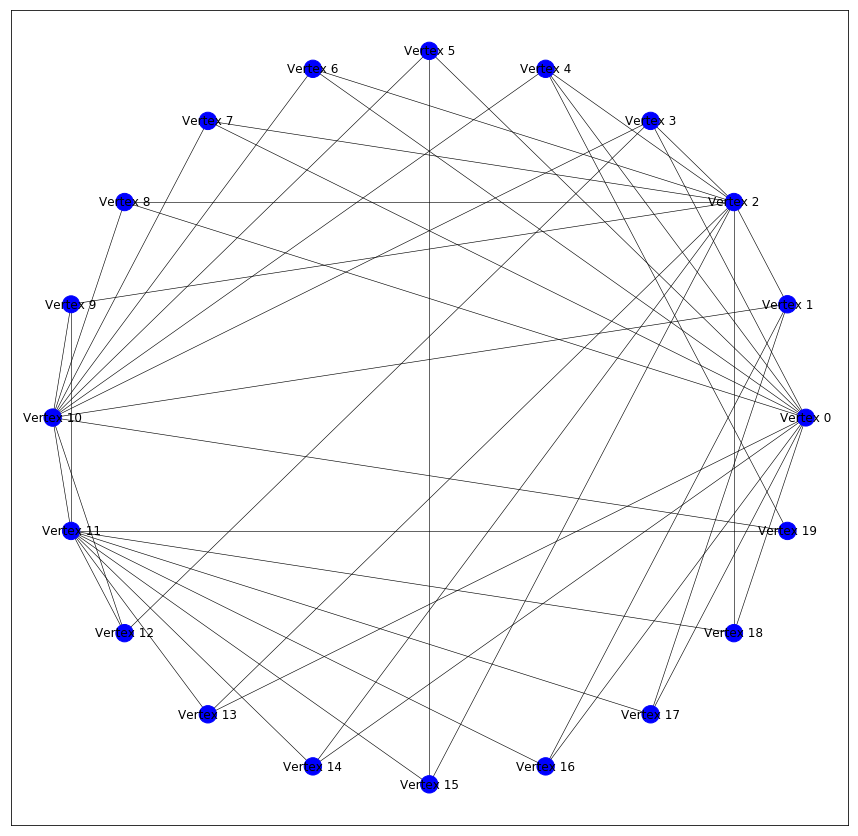

"NON-GROWTH"
Largest component size: [20]
graph density: [0.25263157894736843], 

average path length: 1.7947368421052632, 

diameter: 3, 

second eigenvalue: (1.371581490658216+0j) 

total structural util: 19.099999999999994 

is bipartite: False 

avg nbor overlap: [12.85]



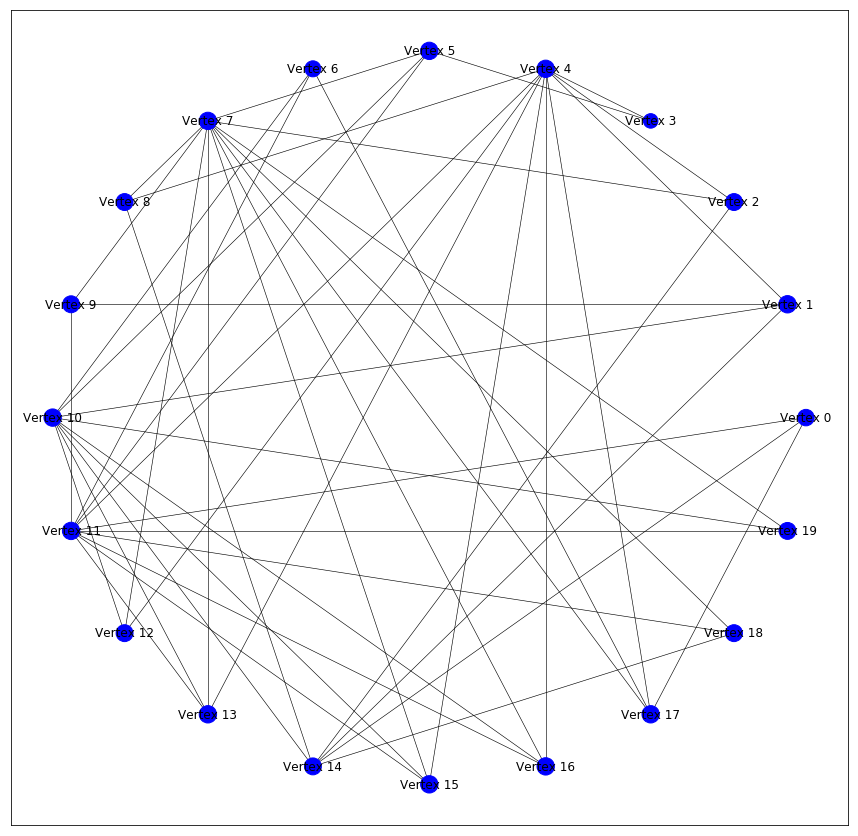

In [4]:
_N_final = 20

# Simul + some vis parameters
num_iters = 50
show_last = 3
show_every = 5
log_every = 1
log_last = 0

# Non-growth
G_ng = attribute_network(_N_final, params)

# Growth
G_g = attribute_network(1, params)

def run_simul_step(G):
    calc_edges(G)
    simul_random_walk(G)
    for v in [ v for v in G.vertices if v.degree == 0 ]:
        attr_util.indep_context_proposal(G, v)
        
print("\x1b[95m\"GROWTH\"\x1b[0m")
#print_metrics(G_g)
vis.draw_graph(G_g)

print("\x1b[95m\"NON-GROWTH\"\x1b[0m")
#print_metrics(G_ng)
vis.draw_graph(G_ng)

for itr in range(num_iters):
    if itr < _N_final - 1:
        add_attr_graph_vtx(G_g)
        
    meets_log = log_every != 0 and ((itr % log_every == 0) or (itr >= num_iters - log_last))
    if meets_log:
        G_g.sim_params['edge_selection'] = attr_util.seq_edge_sel_logged
        G_ng.sim_params['edge_selection'] = attr_util.seq_edge_sel_logged
    else:
        G_g.sim_params['edge_selection'] = attr_util.seq_edge_sel_silent
        G_ng.sim_params['edge_selection'] = attr_util.seq_edge_sel_silent
        
    run_simul_step(G_g)
    run_simul_step(G_ng)
    
    meets_show = (itr % show_every == 0) or (itr >= num_iters - show_last)
    if meets_show:
        print("\x1b[95m\"GROWTH\"\x1b[0m")
        print_metrics(G_g)
        vis.draw_graph(G_g)
        
        print("\x1b[95m\"NON-GROWTH\"\x1b[0m")
        print_metrics(G_ng)
        vis.draw_graph(G_ng)

plt.show()